# **Modelo Determinista**

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split as tts

from sklearn.base import RegressorMixin, ClassifierMixin

from sklearn.metrics import accuracy_score, mean_squared_error, r2_score
from sklearn.metrics import confusion_matrix, f1_score, precision_score

from collections import defaultdict

from itertools import product

from mlxtend.evaluate import confusion_matrix
from mlxtend.plotting import plot_confusion_matrix


def warn(*args, **kwargs):
    pass
import warnings
warnings.warn = warn


class ModelSelector(object):
    Models = [LinearRegression,
              LogisticRegression,
              DecisionTreeClassifier,
              KNeighborsClassifier,
              SVC]
    
    def __init__(self, df: pd.DataFrame, y_labels, x_labels = None):
        self.scores: dict = defaultdict(dict)
        if x_labels == None:
            x_labels = list(df.columns)
            x_labels.remove(y_labels)
        for cls in self.Models:
            self.compile_model(df, x_labels, y_labels, cls)
    
    def compile_model(self, df: pd.DataFrame, x_labels, y_labels, cls):
        X = df[x_labels].values
        y = df[y_labels].values

        X_train, X_test, y_train, y_test = tts(X, y, test_size=0.2, random_state=0)

        if cls == KNeighborsClassifier:
            model = cls(n_neighbors=4)
        else:
            model = cls()
        model.fit(X_train, y_train)

        y_pred = model.predict(X_test)
        self.scores[cls]['score'] = model.score(X_test, y_test)
        if issubclass(cls, RegressorMixin):
            self.scores[cls]['mean_squared_error'] = mean_squared_error(y_test, y_pred)
            self.scores[cls]['root_mean_squared_error (std deviation)'] = np.sqrt(mean_squared_error(y_test, y_pred))
        elif issubclass(cls, ClassifierMixin):
            self.scores[cls]['accuracy_score'] = accuracy_score(y_test, y_pred)
            self.scores[cls]['precision_score'] = precision_score(y_test, y_pred, average='macro')

        return X_train, X_test, y_train, y_test, y_pred

    def display_results(self):
        for cls, scs in self.scores.items():
            print(f'{cls.__name__}')
            for name, value in scs.items():
                print(f'\t{name}: {value}')
    
    def confusion_matrix(self, df: pd.DataFrame, cls, y_labels, x_labels = None): # TODO
        if x_labels == None:
            x_labels = list(df.columns)
            x_labels.remove(y_labels)
        
        _, _, _, y_test, y_pred = self.compile_model(df, x_labels, y_labels, cls)

        sns.set(rc={'figure.figsize':(6,6)})
        cm = confusion_matrix(y_test, y_pred)
        fig, ax = plot_confusion_matrix(conf_mat=cm)
        plt.title('Relative ratios between actual class and predicted class')
        plt.show()

# Potabilidad del Agua

In [ ]:
from google.colab import files
import io
# Requests a file
data = files.upload()

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

df = pd.read_csv(io.BytesIO(data['water_potability.csv']))
df.head()

Saving water_potability.csv to water_potability.csv


,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,NaN,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,NaN,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,NaN,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0


## **Data Peek**

In [ ]:
df.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3276 entries, 0 to 3275
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               2785 non-null   float64
 1   Hardness         3276 non-null   float64
 2   Solids           3276 non-null   float64
 3   Chloramines      3276 non-null   float64
 4   Sulfate          2495 non-null   float64
 5   Conductivity     3276 non-null   float64
 6   Organic_carbon   3276 non-null   float64
 7   Trihalomethanes  3114 non-null   float64
 8   Turbidity        3276 non-null   float64
 9   Potability       3276 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 256.1 KB


In [ ]:
df.describe()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
count,2785.000000,3276.000000,3276.000000,3276.000000,2495.000000,3276.000000,3276.000000,3114.000000,3276.000000,3276.000000
mean,7.080795,196.369496,22014.092526,7.122277,333.775777,426.205111,14.284970,66.396293,3.966786,0.390110
std,1.594320,32.879761,8768.570828,1.583085,41.416840,80.824064,3.308162,16.175008,0.780382,0.487849
min,0.000000,47.432000,320.942611,0.352000,129.000000,181.483754,2.200000,0.738000,1.450000,0.000000
25%,6.093092,176.850538,15666.690297,6.127421,307.699498,365.734414,12.065801,55.844536,3.439711,0.000000
50%,7.036752,196.967627,20927.833607,7.130299,333.073546,421.884968,14.218338,66.622485,3.955028,0.000000
75%,8.062066,216.667456,27332.762127,8.114887,359.950170,481.792304,16.557652,77.337473,4.500320,1.000000
max,14.000000,323.124000,61227.196008,13.127000,481.030642,753.342620,28.300000,124.000000,6.739000,1.000000


In [ ]:
df.astype('object').describe(include='all').loc['unique', :]

ph                 2785.0
Hardness           3276.0
Solids             3276.0
Chloramines        3276.0
Sulfate            2495.0
Conductivity       3276.0
Organic_carbon     3276.0
Trihalomethanes    3114.0
Turbidity          3276.0
Potability            2.0
Name: unique, dtype: float64

In [ ]:
df.isnull().sum()

ph                 491
Hardness             0
Solids               0
Chloramines          0
Sulfate            781
Conductivity         0
Organic_carbon       0
Trihalomethanes    162
Turbidity            0
Potability           0
dtype: int64

In [ ]:
df.isna().sum()

ph                 491
Hardness             0
Solids               0
Chloramines          0
Sulfate            781
Conductivity         0
Organic_carbon       0
Trihalomethanes    162
Turbidity            0
Potability           0
dtype: int64

## **Selecting and Preprocessing**

In [ ]:
df_copy = df.copy()

df_copy[['ph', 'Sulfate', 'Trihalomethanes']] = \
    df_copy[['ph', 'Sulfate', 'Trihalomethanes']].replace(np.nan,
                                                          df_copy[['ph', 'Sulfate', 'Trihalomethanes']].mean())

df_copy.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,7.080795,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,333.775777,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,333.775777,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0


In [ ]:
df_copy.isna().sum()

ph                 0
Hardness           0
Solids             0
Chloramines        0
Sulfate            0
Conductivity       0
Organic_carbon     0
Trihalomethanes    0
Turbidity          0
Potability         0
dtype: int64

In [ ]:
df_copy.isnull().sum()

ph                 0
Hardness           0
Solids             0
Chloramines        0
Sulfate            0
Conductivity       0
Organic_carbon     0
Trihalomethanes    0
Turbidity          0
Potability         0
dtype: int64

## **Visualizando los Datos**

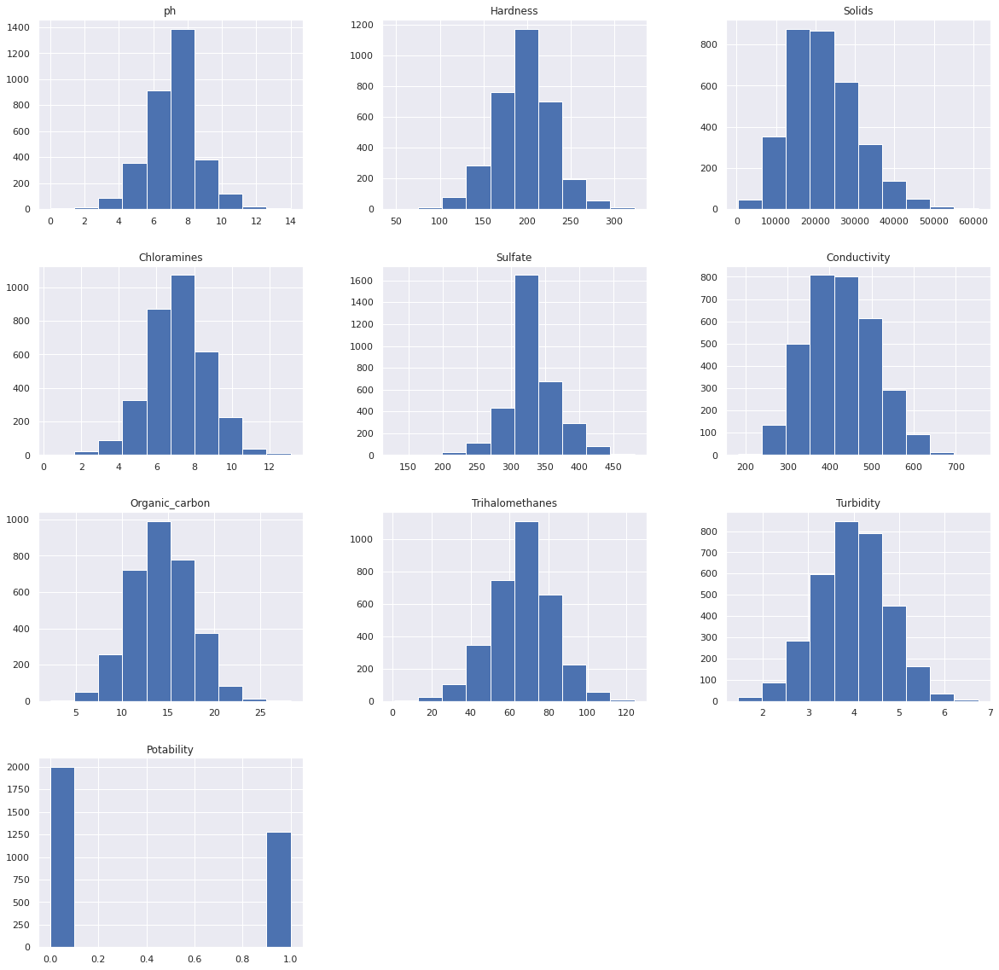

In [ ]:
sns.set(rc={'figure.figsize':(20,20)})
df_copy.hist()
plt.show()

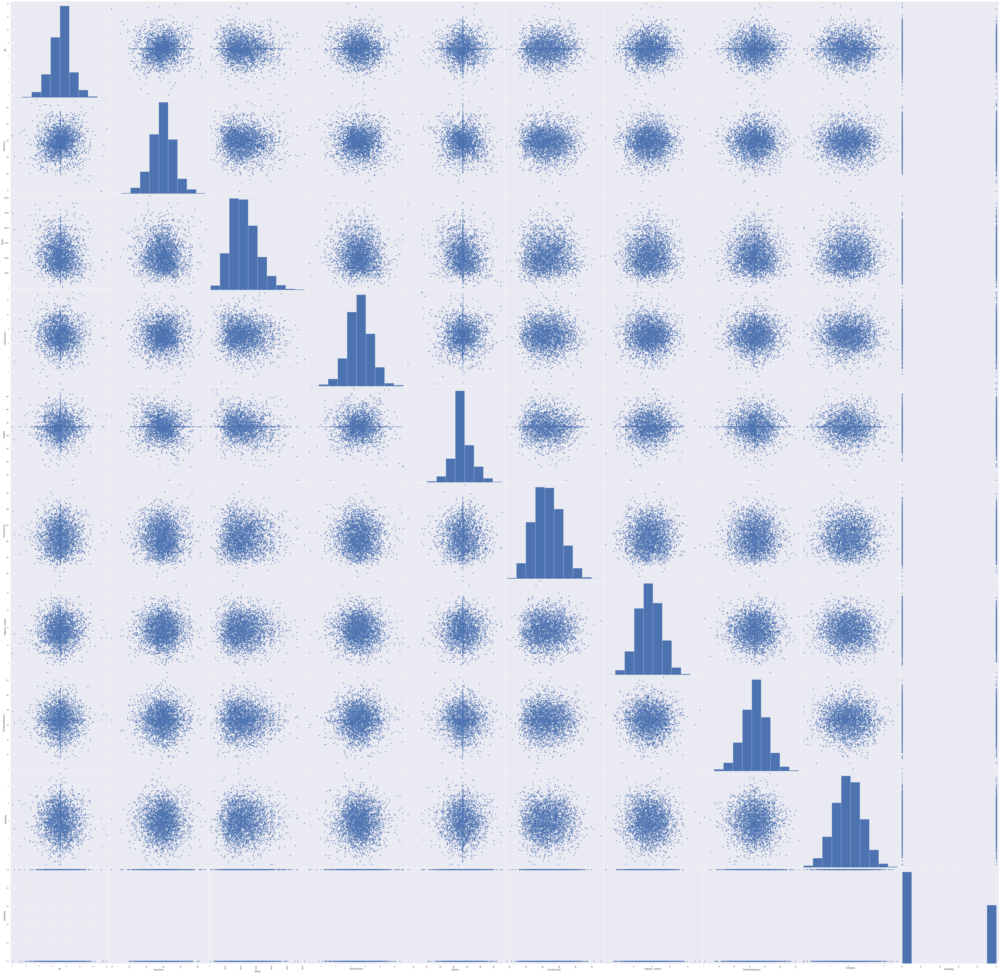

In [ ]:
dist = pd.plotting.scatter_matrix(df_copy, figsize=(100,100), marker='o', alpha=0.8)

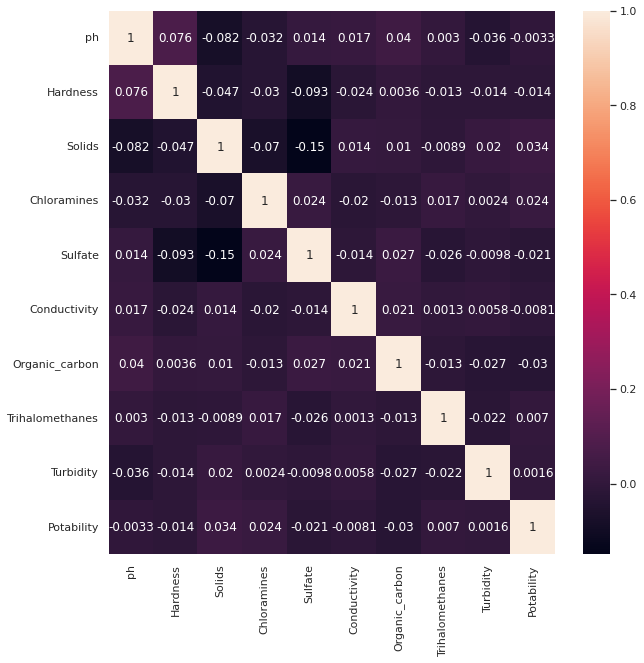

In [ ]:
sns.set(rc={'figure.figsize':(10,10)})
sns.heatmap(data=df_copy.corr(method='pearson'), annot=True)

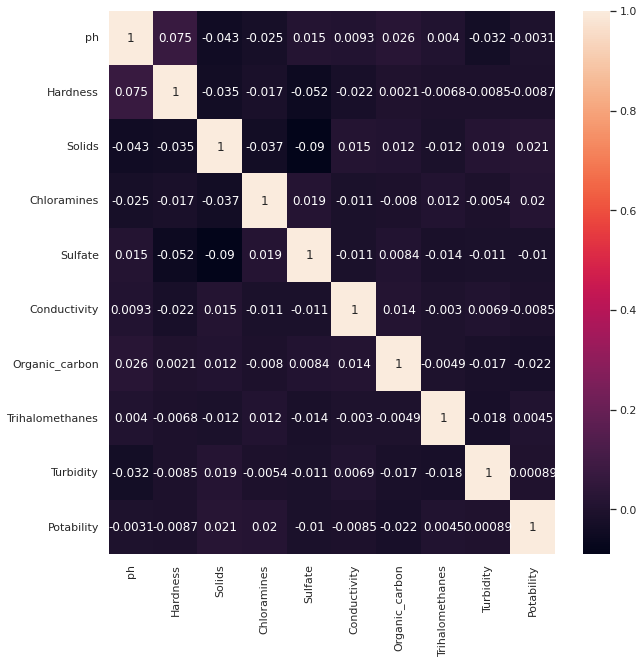

In [ ]:
sns.heatmap(data=df_copy.corr(method='kendall'), annot=True)

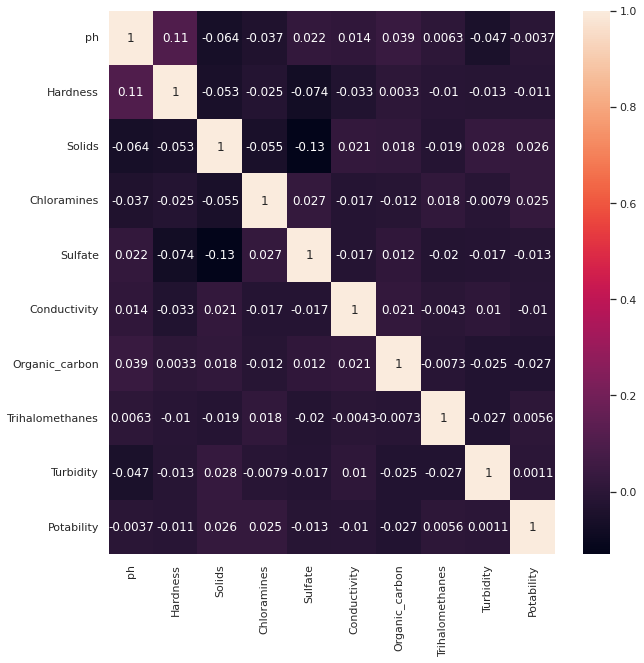

In [ ]:
sns.heatmap(data=df_copy.corr(method='spearman'), annot=True)

## **Model Training**

In [ ]:
selector = ModelSelector(df_copy, 'Potability')
selector.display_results()

LinearRegression
	score: -0.001830838116009481
	mean_squared_error: 0.23403120002538996
	root_mean_squared_error (std deviation): 0.48376771288025205
LogisticRegression
	score: 0.6280487804878049
	accuracy_score: 0.6280487804878049
	precision_score: 0.31402439024390244
DecisionTreeClassifier
	score: 0.5884146341463414
	accuracy_score: 0.5884146341463414
	precision_score: 0.5614384236453202
KNeighborsClassifier
	score: 0.5685975609756098
	accuracy_score: 0.5685975609756098
	precision_score: 0.46950841118360365
SVC
	score: 0.6265243902439024
	accuracy_score: 0.6265243902439024
	precision_score: 0.3137404580152672


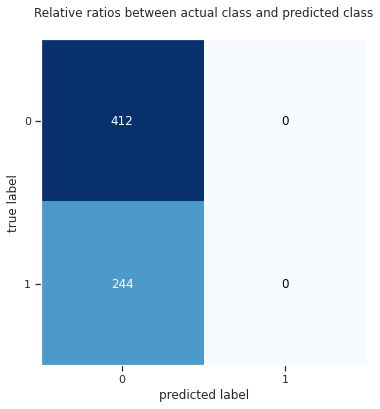

In [ ]:
selector.confusion_matrix(df_copy, LogisticRegression, 'Potability')

In [ ]:
df_cleared = df.copy()

df_cleared.dropna(how='any', inplace=True)

selector = ModelSelector(df_cleared, 'Potability')
selector.display_results()

LinearRegression
	score: -0.013471437122491993
	mean_squared_error: 0.23745368252612273
	root_mean_squared_error (std deviation): 0.4872921941978167
LogisticRegression
	score: 0.6327543424317618
	accuracy_score: 0.6327543424317618
	precision_score: 0.815
DecisionTreeClassifier
	score: 0.6228287841191067
	accuracy_score: 0.6228287841191067
	precision_score: 0.601752990092911
KNeighborsClassifier
	score: 0.6104218362282878
	accuracy_score: 0.6104218362282878
	precision_score: 0.5498927498927498
SVC
	score: 0.6253101736972705
	accuracy_score: 0.6253101736972705
	precision_score: 0.31265508684863524


In [ ]:
import itertools

cols = list(df.columns)
cols.remove('Potability')
for l in range(len(cols)-1, len(cols)+1):
    for subset in itertools.combinations(cols, l):
        t = list(subset)
        if t:
            print('\n', t)
            selector = ModelSelector(df_cleared, 'Potability', t)
            selector.display_results()


 ['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate', 'Conductivity', 'Organic_carbon', 'Trihalomethanes']
LinearRegression
	score: -0.013841484452064234
	mean_squared_error: 0.2375403836386527
	root_mean_squared_error (std deviation): 0.48738114821836587
LogisticRegression
	score: 0.6327543424317618
	accuracy_score: 0.6327543424317618
	precision_score: 0.815
DecisionTreeClassifier
	score: 0.6054590570719603
	accuracy_score: 0.6054590570719603
	precision_score: 0.5785638998682477
KNeighborsClassifier
	score: 0.5533498759305211
	accuracy_score: 0.5533498759305211
	precision_score: 0.5067482014388489
SVC
	score: 0.6253101736972705
	accuracy_score: 0.6253101736972705
	precision_score: 0.31265508684863524

 ['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate', 'Conductivity', 'Organic_carbon', 'Turbidity']
LinearRegression
	score: -0.012228823708500869
	mean_squared_error: 0.23716254148326676
	root_mean_squared_error (std deviation): 0.4869933690341859
LogisticRegression
	score: 0.6327